In [0]:
import sqlite3
import pandas as pd
import os
import re

In [0]:
db_path_warehouse = "/Workspace/Users/jonathashonorio@gmail.com/Projeto_Seguros/data_warehouse.db"
 
# Nome da tabela que você quer ler
table_name = "acidentes"

# Conectando ao banco
conn = sqlite3.connect(db_path_warehouse)
 
# Lendo apenas a tabela desejada
df = pd.read_sql_query(f"SELECT * FROM {table_name}", conn)
 
# Fechando a conexão
conn.close()
 
# Exibindo o DataFrame
display(df)

id,pesid,data_inversa,uf,causa_acidente,tipo_acidente,id_veiculo,tipo_veiculo,marca,ano_fabricacao_veiculo,tipo_envolvido,idade,sexo
405147,911179,2022-01-01,CE,Ingestão de álcool pelo condutor,Colisão transversal,734115,Motocicleta,HONDA/CG150 TITAN MIX ES,2009,Condutor,59.0,Masculino
405149,912793,2022-01-01,PE,Reação tardia ou ineficiente do condutor,Queda de ocupante de veículo,734109,Motocicleta,YAMAHA/FACTOR YBR125 K,2009,Condutor,37.0,Masculino
405151,910367,2022-01-01,PI,Ingestão de álcool pelo condutor,Colisão traseira,734137,Automóvel,FIAT/UNO ELECTRONIC,1994,Condutor,50.0,Masculino
405153,906773,2022-01-01,PR,Velocidade Incompatível,Capotamento,734117,Caminhonete,FIAT/STRADA WORKING CE,2014,Condutor,50.0,Masculino
405154,906295,2022-01-01,PI,Velocidade Incompatível,Tombamento,734107,Automóvel,FIAT/SIENA EL 1.0 FLEX,2013,Condutor,null,Não Informado
405155,906314,2022-01-01,RJ,Chuva,Queda de ocupante de veículo,734129,Motocicleta,HONDA/CG 160 FAN,2021,Condutor,36.0,Masculino
405156,907661,2022-01-01,BA,Condutor Dormindo,Saída de leito carroçável,734112,Automóvel,GM/CORSA WIND,1999,Condutor,37.0,Masculino
405157,908465,2022-01-01,PB,Animais na Pista,Atropelamento de Animal,734141,Automóvel,FIAT/UNO MILLE FIRE FLEX,2006,Condutor,38.0,Feminino
405159,908925,2022-01-01,MS,Avarias e/ou desgaste excessivo no pneu,Tombamento,735793,Automóvel,FIAT/SIENA EL 1.4 FLEX,2013,Condutor,35.0,Feminino
405161,907859,2022-01-01,SP,Velocidade Incompatível,Colisão com objeto,734168,Caminhonete,CHEVROLET/MONTANA LS,2013,Condutor,23.0,Masculino


- Quantidade de acidentes por faixa etária por região (1 gráfico por ano)
- Quantidade de acidentes por região, ano e sexo  
- Quantidade de acidentes por tipo de veículo no ano
- Quantidade de acidentes por tipo de acidente por ano
- Quantidade de acidentes por faixa etária
- Quantidade de acidentes total por ESTADO por ano 
- Quantidade de acidentes por ano de fabricação e tipo de veículo no ano  
- Tipo de acidente MAIS RECORRENTE por faixa etária e ano 
    TOP 3 acidentes por facha etária no ano


In [0]:
# Quantidade de acidentes por região

from pyspark.sql import functions as F

# Dicionário de regiões
regioes = {
    'Norte': ['AC','AP','AM','PA','RO','RR','TO'],
    'Nordeste': ['AL','BA','CE','MA','PB','PE','PI','RN','SE'],
    'Centro-Oeste': ['GO','MT','MS','DF'],
    'Sudeste': ['ES','MG','RJ','SP'],
    'Sul': ['PR','RS','SC']
}

def map_regiao(uf):
    for regiao, estados in regioes.items():
        if uf in estados:
            return regiao
    return 'Outros'


map_regiao_udf = F.udf(map_regiao)

df = spark.createDataFrame(df)
df = df.withColumn('regiao', map_regiao_udf(F.col('uf')))
df = df.withColumn("ano", F.year(F.to_date(F.col("data_inversa"), "yyyy-MM-dd")))


acidentes_por_ano = (
    df.groupBy("ano", "regiao")
      .agg(F.count("*").alias("qtd_acidentes"))
      .orderBy("ano", "regiao")
)
total = acidentes_por_ano.agg(F.sum("qtd_acidentes").alias("total_acidentes"))
display(acidentes_por_ano)
display(total)


ano,regiao,qtd_acidentes
2022,Centro-Oeste,6410
2022,Nordeste,11603
2022,Norte,3033
2022,Sudeste,16464
2022,Sul,17531
2023,Centro-Oeste,6689
2023,Nordeste,12637
2023,Norte,3056
2023,Sudeste,18381
2023,Sul,17510


total_acidentes
176537


In [0]:
# Quantidade de acidentes por faixa etária por região

df = df.withColumn("faixa_etaria", 
    F.when(F.col("idade").isNull(), "Não informada")
     .when((F.col("idade") >= 18) & (F.col("idade") <= 25), "1")
     .when((F.col("idade") >= 26) & (F.col("idade") <= 35), "2")
     .when((F.col("idade") >= 36) & (F.col("idade") <= 45), "3")
     .when((F.col("idade") >= 46) & (F.col("idade") <= 55), "4")
     .when(F.col("idade") > 55, "5")
     .otherwise("Não informada")
)

acidentes_por_faixa_regiao = (
    df.groupBy("ano", "regiao", "faixa_etaria")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy("ano", "regiao", "faixa_etaria")
)

display(acidentes_por_faixa_regiao)

total = acidentes_por_ano.agg(F.sum("qtd_acidentes").alias("total_acidentes"))
display(total)


ano,regiao,faixa_etaria,qtd_acidentes
2022,Centro-Oeste,1,875
2022,Centro-Oeste,2,1736
2022,Centro-Oeste,3,1494
2022,Centro-Oeste,4,933
2022,Centro-Oeste,5,891
2022,Centro-Oeste,Não informada,481
2022,Nordeste,1,1393
2022,Nordeste,2,2968
2022,Nordeste,3,2849
2022,Nordeste,4,1686


total_acidentes
176537


In [0]:
# Quantidade de acidentes por sexo

acidentes_por_sexo = (
    df.groupBy("ano", "sexo")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy("ano", "sexo")
)

display(acidentes_por_sexo)

total = acidentes_por_ano.agg(F.sum("qtd_acidentes").alias("total_acidentes"))
display(total)


ano,sexo,qtd_acidentes
2022,Feminino,7222
2022,Ignorado,192
2022,Masculino,44161
2022,Não Informado,3466
2023,Feminino,7796
2023,Ignorado,141
2023,Masculino,46784
2023,Não Informado,3552
2024,Feminino,8232
2024,Ignorado,167


total_acidentes
176537


In [0]:
# Quantidade de acidentes por sexo e região

acidentes_por_sexo_regiao = (
    df.groupBy("ano", "regiao", "sexo")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy("ano", "regiao", "sexo")
)

display(acidentes_por_sexo_regiao)

total = acidentes_por_ano.agg(F.sum("qtd_acidentes").alias("total_acidentes"))
display(total)


ano,regiao,sexo,qtd_acidentes
2022,Centro-Oeste,Feminino,928
2022,Centro-Oeste,Ignorado,13
2022,Centro-Oeste,Masculino,5108
2022,Centro-Oeste,Não Informado,361
2022,Nordeste,Feminino,1100
2022,Nordeste,Ignorado,41
2022,Nordeste,Masculino,9479
2022,Nordeste,Não Informado,983
2022,Norte,Feminino,442
2022,Norte,Ignorado,9


total_acidentes
176537


In [0]:
# Quantidade de acidentes por tipo de veículo por ano

total_por_tipo_veiculo = (
    df.groupBy("tipo_veiculo")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy(F.desc("qtd_acidentes"))
)

display(total_por_tipo_veiculo)

total = total_por_tipo_veiculo.agg(F.sum("qtd_acidentes").alias("total_acidentes"))
display(total)


tipo_veiculo,qtd_acidentes
Automóvel,88926
Motocicleta,56155
Caminhonete,20780
Motoneta,6634
Utilitário,3267
Outros,775


total_acidentes
176537


In [0]:
# Quantidades de acidentes por tipo de acidente por ano
total_por_tipo_acidente = (
    df.groupBy("tipo_acidente")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy(F.desc("qtd_acidentes"))
)

display(total_por_tipo_acidente)


tipo_acidente,qtd_acidentes
Queda de ocupante de veículo,41585
Colisão traseira,22228
Saída de leito carroçável,16228
Colisão com objeto,15883
Colisão transversal,15273
Tombamento,13914
Capotamento,13639
Colisão lateral mesmo sentido,11058
Colisão frontal,8440
Atropelamento de Pedestre,6620


In [0]:
# Quantidades de acidentes por ano
total_por_ano = (
    df.groupBy("ano")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy(F.desc("qtd_acidentes"))
)

display(total_por_ano)	

ano,qtd_acidentes
2024,63223
2023,58273
2022,55041


In [0]:
# Quantidades de acidentes por faixa etária por ano
total_por_faixa_etaria = (
    df.groupBy("faixa_etaria")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy(F.desc("qtd_acidentes"))
)

display(total_por_faixa_etaria)

faixa_etaria,qtd_acidentes
2,44662
3,40616
1,26057
4,25833
5,23879
Não informada,15490


In [0]:
# Quantidade de acidentes por ESTADO por ano

acidentes_por_estado_por_ano = (
    df.groupBy("ano", "uf")
    .agg(F.count("*")
    .alias("qtd_acidentes"))
    .orderBy("ano", "uf")
)

display(acidentes_por_estado_por_ano)

ano,uf,qtd_acidentes
2022,AC,214
2022,AL,469
2022,AM,86
2022,AP,167
2022,BA,2721
2022,CE,1177
2022,DF,855
2022,ES,1988
2022,GO,2624
2022,MA,887


In [0]:
# Quant carros por ano, por região

qtd_carros_anofab = (
    df.groupBy("regiao", "ano_fabricacao_veiculo")
    .agg(F.count("*")
    .alias("qtd_carros"))
    .orderBy("regiao", "ano_fabricacao_veiculo")
)

display(qtd_carros_anofab)

regiao,ano_fabricacao_veiculo,qtd_carros
Centro-Oeste,0,967
Centro-Oeste,1900,4
Centro-Oeste,1929,1
Centro-Oeste,1955,1
Centro-Oeste,1969,2
Centro-Oeste,1973,1
Centro-Oeste,1974,2
Centro-Oeste,1975,1
Centro-Oeste,1976,1
Centro-Oeste,1977,1


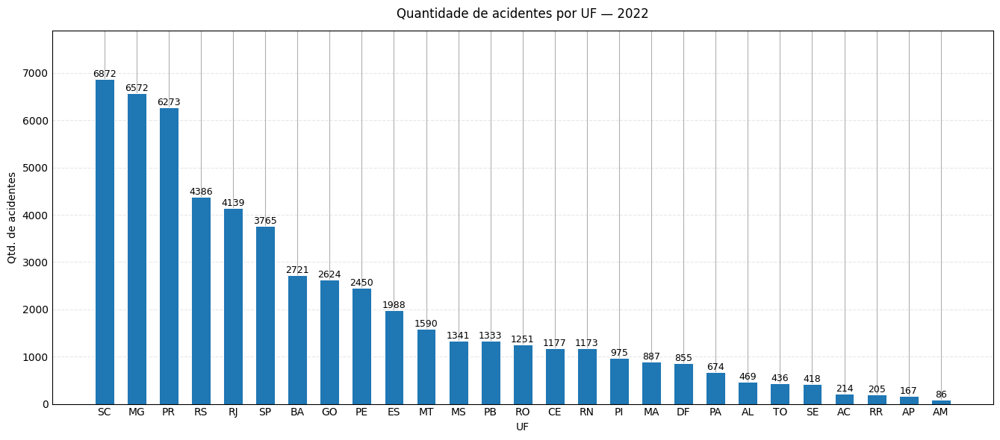

In [0]:
# --- Spark: filtrar apenas 2022 ---
from pyspark.sql import functions as F

acidentes_2022 = (
    acidentes_por_estado_por_ano
    .filter(F.col("ano") == 2022)
    .orderBy(F.desc("qtd_acidentes"))  # opcional: ordenar por valor
)

# Converter para pandas para plotar com Matplotlib
pdf_2022 = acidentes_2022.toPandas()

# --- Matplotlib ---
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('_mpl-gallery')

ufs = pdf_2022["uf"].tolist()
vals = pdf_2022["qtd_acidentes"].tolist()

x = np.arange(len(ufs))

fig, ax = plt.subplots(figsize=(max(10, len(ufs) * 0.5), 6))

bars = ax.bar(x, vals, width=0.6, edgecolor="white", linewidth=0.7, color="C0")

# Títulos e eixos
ax.set_title("Quantidade de acidentes por UF — 2022", pad=12)
ax.set_xlabel("UF")
ax.set_ylabel("Qtd. de acidentes")
ax.set_xticks(x)
ax.set_xticklabels(ufs, rotation=0)

# Limites e grade (ajuste automático do Y)
ax.set_ylim(0, max(vals) * 1.15 if len(vals) else 1)
ax.grid(axis="y", linestyle="--", alpha=0.3)

# Anotar valores no topo das barras (opcional)
for rect in bars:
    h = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, h, f"{int(h)}",
            ha="center", va="bottom", fontsize=9)

fig.tight_layout()
plt.show()

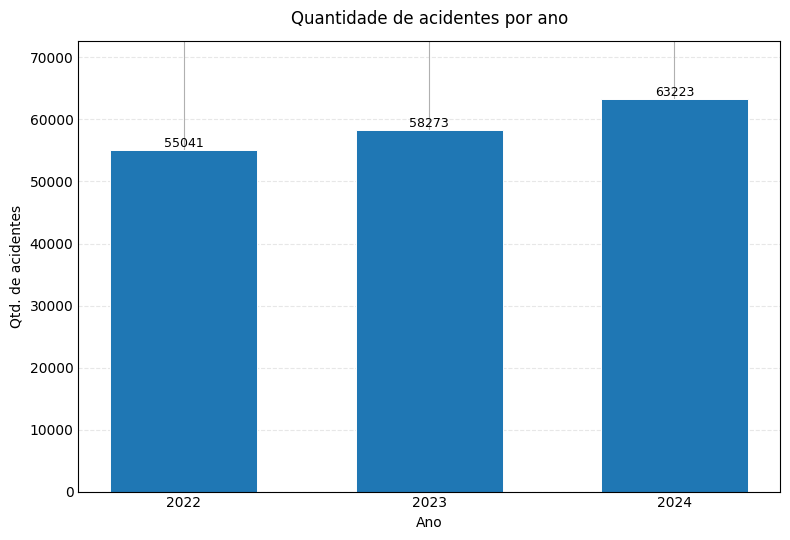

In [0]:
# --- Spark -> pandas ---
pdf_total = total_por_ano.toPandas()

# Para leitura lógica, ordene por ano ASC (ou mantenha por qtd se preferir)
pdf_total = pdf_total.sort_values("ano")

import matplotlib.pyplot as plt
import numpy as np

plt.style.use('_mpl-gallery')

anos = pdf_total["ano"].astype(str).tolist()
vals = pdf_total["qtd_acidentes"].tolist()

x = np.arange(len(anos))

fig, ax = plt.subplots(figsize=(max(8, len(anos) * 0.6), 5.5))

bars = ax.bar(x, vals, width=0.6, edgecolor="white", linewidth=0.7, color="C0")

ax.set_title("Quantidade de acidentes por ano", pad=12)
ax.set_xlabel("Ano")
ax.set_ylabel("Qtd. de acidentes")

ax.set_xticks(x)
ax.set_xticklabels(anos, rotation=0)
ax.set_ylim(0, max(vals) * 1.15 if len(vals) else 1)
ax.grid(axis="y", linestyle="--", alpha=0.3)

# Anotar valores nas barras (opcional)
for rect in bars:
    h = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, h, f"{int(h)}",
            ha="center", va="bottom", fontsize=9)

fig.tight_layout()
plt.show()


In [0]:
from pyspark.sql import functions as F

# Se precisar: detectar se a coluna 'ano' já existe
tem_ano = "ano" in df.columns

# Extrai 'ano' de 'data_inversa' caso ainda não exista
# Tenta formatos 'yyyy-MM-dd' e 'dd/MM/yyyy' (ajuste se o seu for diferente)
if not tem_ano:
    df = df.withColumn(
        "dt",
        F.coalesce(
            F.to_date("data_inversa", "yyyy-MM-dd"),
            F.to_date("data_inversa", "dd/MM/yyyy")
        )
    ).withColumn("ano", F.year(F.col("dt")))

# Garantir que idade é numérica (inteiro), quando vier como string
df = df.withColumn("idade_int", F.col("idade").cast("int"))

# Criar a faixa etária
df = df.withColumn(
    "faixa_idade",
    F.when((F.col("idade_int") >= 18) & (F.col("idade_int") <= 25), "18–25")
     .when((F.col("idade_int") >= 26) & (F.col("idade_int") <= 35), "26–35")
     .when((F.col("idade_int") >= 36) & (F.col("idade_int") <= 45), "36–45")
     .when((F.col("idade_int") >= 46) & (F.col("idade_int") <= 55), "46–55")
     .when(F.col("idade_int") > 55, "55+")
     # Se quiser excluir <18 e nulos, deixe sem 'otherwise'. Se quiser marcar:
     # .otherwise("Ignorado/<18")
)

# Opcional: normalizar 'tipo_acidente' (trim)
df = df.withColumn("tipo_acidente", F.trim(F.col("tipo_acidente")))


In [0]:
# Conte apenas faixas válidas (exclui <18 / nulos)
acc_por_faixa_ano = (
    df.filter(F.col("faixa_idade").isNotNull())
      .groupBy("ano", "faixa_idade")
      .agg(F.count("*").alias("qtd_acidentes"))
)

# Ordenação amigável das faixas
ordem = F.when(F.col("faixa_idade")=="18–25", 1) \
         .when(F.col("faixa_idade")=="26–35", 2) \
         .when(F.col("faixa_idade")=="36–45", 3) \
         .when(F.col("faixa_idade")=="46–55", 4) \
         .when(F.col("faixa_idade")=="55+",   5)

acc_por_faixa_ano = acc_por_faixa_ano.orderBy("ano", ordem)

display(acc_por_faixa_ano)

ano,faixa_idade,qtd_acidentes
2022,18–25,8055
2022,26–35,14317
2022,36–45,12679
2022,46–55,7914
2022,55+,7276
2023,18–25,8504
2023,26–35,14552
2023,36–45,13605
2023,46–55,8591
2023,55+,8076


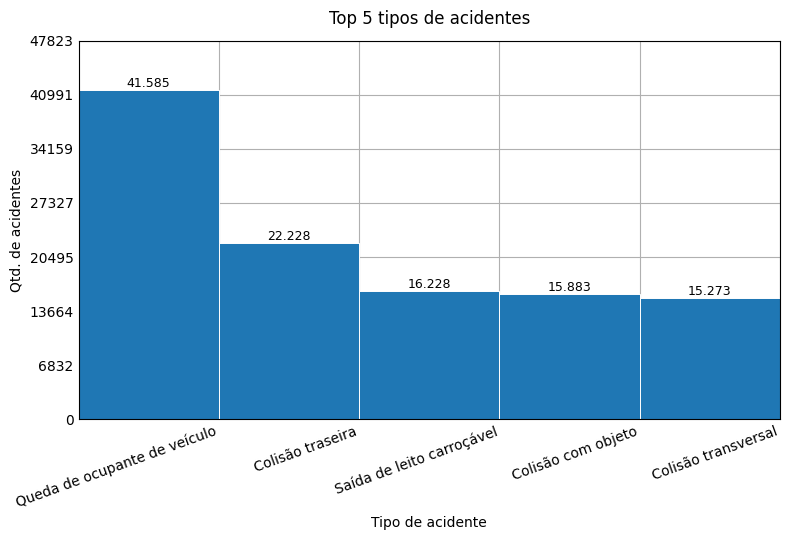

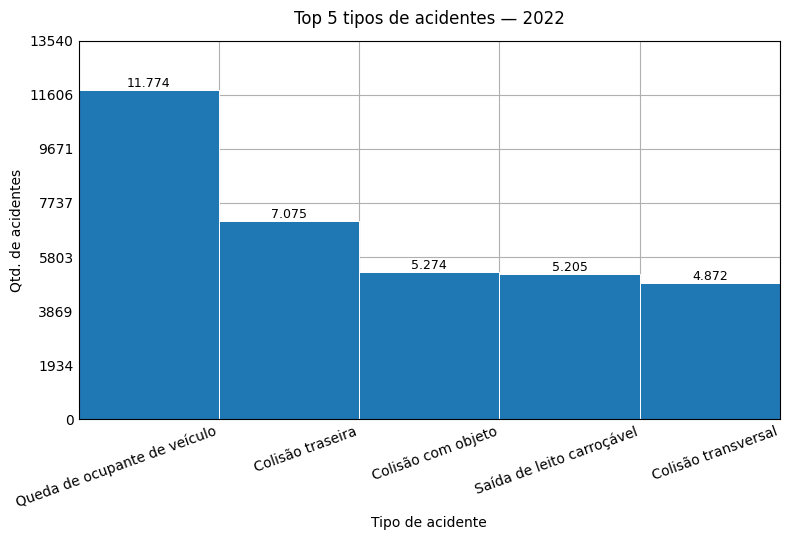

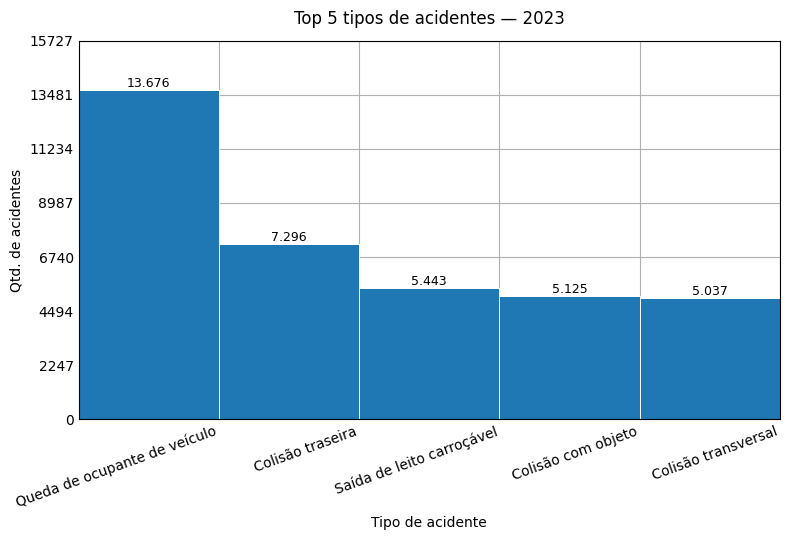

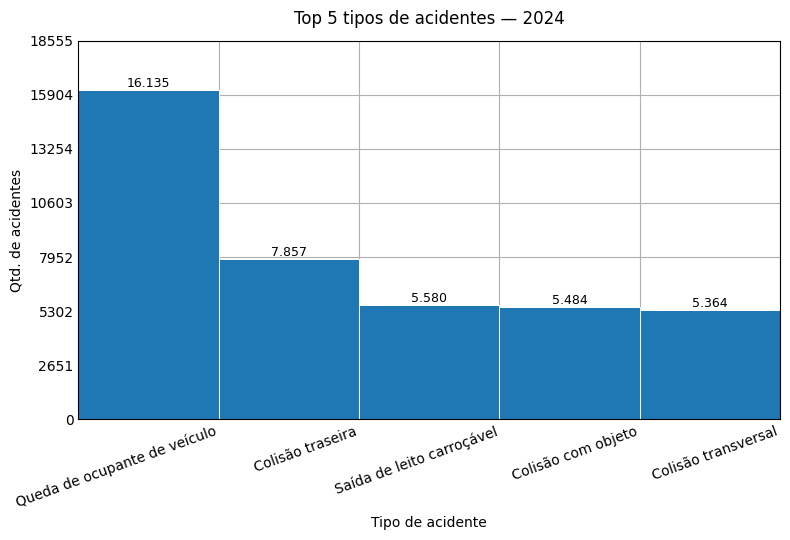

In [0]:
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import numpy as np

plt.style.use('_mpl-gallery')

def plot_top5_tipos_like_example(df_spark, ano_escolhido=None, titulo_prefixo="Top 5 tipos de acidentes"):
    # 1) (Opcional) filtro por ano
    dff = df_spark
    if ano_escolhido is not None:
        dff = dff.filter(F.col("ano") == int(ano_escolhido))

    # 2) Agregar por tipo e pegar Top-5
    top5 = (
        dff.groupBy("tipo_acidente")
           .agg(F.count("*").alias("qtd"))
           .orderBy(F.desc("qtd"))
           .limit(5)
    ).toPandas()

    if top5.empty:
        print("Sem dados após o filtro.")
        return

    # Ordenar desc para plot
    top5 = top5.sort_values("qtd", ascending=False)
    tipos = top5["tipo_acidente"].tolist()
    vals  = top5["qtd"].tolist()

    # 3) Plot no estilo exato do seu exemplo
    N = len(vals)  # deve ser 5
    x = 0.5 + np.arange(N)

    fig, ax = plt.subplots(figsize=(max(8, N * 1.2), 5.5))

    ax.bar(x, vals, width=1, edgecolor="white", linewidth=0.7, color="C0")

    # Eixo/Grades no mesmo padrão
    ax.set(
        xlim=(0, N), 
        xticks=np.arange(1, N + 1),
        ylim=(0, max(vals) * 1.15 if vals else 1),
        yticks=np.linspace(0, max(vals) * 1.15 if vals else 1, num=8)  # 8 marcas, similar ao exemplo
    )

    # Substituir os números do eixo X pelos rótulos dos tipos
    ax.set_xticklabels(tipos, rotation=20, ha="right")

    # Títulos
    sufixo_ano = f" — {ano_escolhido}" if ano_escolhido is not None else ""
    ax.set_title(f"{titulo_prefixo}{sufixo_ano}", pad=12)
    ax.set_xlabel("Tipo de acidente")
    ax.set_ylabel("Qtd. de acidentes")

    # (Opcional) rótulos no topo das colunas
    for xi, v in zip(x, vals):
        ax.text(xi, v, f"{int(v):,}".replace(",", "."), ha="center", va="bottom", fontsize=9)

    plt.tight_layout()
    plt.show()

# Top-5 geral (sem filtrar ano)
plot_top5_tipos_like_example(df)

# Top-5 em 2022, 2023 e 2024 (apenas 5 colunas, estilo idêntico ao exemplo)
plot_top5_tipos_like_example(df, ano_escolhido=2022)
plot_top5_tipos_like_example(df, ano_escolhido=2023)
plot_top5_tipos_like_example(df, ano_escolhido=2024)




In [0]:
from pyspark.sql import functions as F

# Dicionário de regiões
regioes = {
    'Norte': ['AC','AP','AM','PA','RO','RR','TO'],
    'Nordeste': ['AL','BA','CE','MA','PB','PE','PI','RN','SE'],
    'Centro-Oeste': ['GO','MT','MS','DF'],
    'Sudeste': ['ES','MG','RJ','SP'],
    'Sul': ['PR','RS','SC']
}

def map_regiao(uf):
    for regiao, estados in regioes.items():
        if uf in estados:
            return regiao
    return 'Outros'


map_regiao_udf = F.udf(map_regiao)

df = spark.createDataFrame(df)
df = df.withColumn('regiao', map_regiao_udf(F.col('uf')))
display(df)

id,pesid,data_inversa,uf,causa_acidente,tipo_acidente,id_veiculo,tipo_veiculo,marca,ano_fabricacao_veiculo,tipo_envolvido,idade,sexo,regiao
405147,911179,2022-01-01,CE,Ingestão de álcool pelo condutor,Colisão transversal,734115,Motocicleta,HONDA/CG150 TITAN MIX ES,2009,Condutor,59.0,Masculino,Nordeste
405149,912793,2022-01-01,PE,Reação tardia ou ineficiente do condutor,Queda de ocupante de veículo,734109,Motocicleta,YAMAHA/FACTOR YBR125 K,2009,Condutor,37.0,Masculino,Nordeste
405151,910367,2022-01-01,PI,Ingestão de álcool pelo condutor,Colisão traseira,734137,Automóvel,FIAT/UNO ELECTRONIC,1994,Condutor,50.0,Masculino,Nordeste
405153,906773,2022-01-01,PR,Velocidade Incompatível,Capotamento,734117,Caminhonete,FIAT/STRADA WORKING CE,2014,Condutor,50.0,Masculino,Sul
405154,906295,2022-01-01,PI,Velocidade Incompatível,Tombamento,734107,Automóvel,FIAT/SIENA EL 1.0 FLEX,2013,Condutor,null,Não Informado,Nordeste
405155,906314,2022-01-01,RJ,Chuva,Queda de ocupante de veículo,734129,Motocicleta,HONDA/CG 160 FAN,2021,Condutor,36.0,Masculino,Sudeste
405156,907661,2022-01-01,BA,Condutor Dormindo,Saída de leito carroçável,734112,Automóvel,GM/CORSA WIND,1999,Condutor,37.0,Masculino,Nordeste
405157,908465,2022-01-01,PB,Animais na Pista,Atropelamento de Animal,734141,Automóvel,FIAT/UNO MILLE FIRE FLEX,2006,Condutor,38.0,Feminino,Nordeste
405159,908925,2022-01-01,MS,Avarias e/ou desgaste excessivo no pneu,Tombamento,735793,Automóvel,FIAT/SIENA EL 1.4 FLEX,2013,Condutor,35.0,Feminino,Centro-Oeste
405161,907859,2022-01-01,SP,Velocidade Incompatível,Colisão com objeto,734168,Caminhonete,CHEVROLET/MONTANA LS,2013,Condutor,23.0,Masculino,Sudeste


In [0]:
import sqlite3

# Caminho do banco no DBFS
db_path = "/Workspace/Users/jonathashonorio@gmail.com/Projeto_Seguros/data_warehouse.db"

# Converte o DataFrame Spark para Pandas
df_pandas = df.toPandas()

# Conectar ao banco
conn = sqlite3.connect(db_path)

# Nome da tabela onde você quer salvar os dados
table_name = "acidentes"

# Salvar os dados no banco (append ou replace)
df_pandas.to_sql(table_name, conn, if_exists="replace", index=False)

# Confirmar e fechar conexão
conn.commit()
conn.close()

print(f"Dados salvos na tabela '{table_name}' com sucesso!")


Dados salvos na tabela 'acidentes' com sucesso!


In [0]:
import sqlite3
import pandas as pd

# Caminho do banco no DBFS
db_path = "/Workspace/Users/jonathashonorio@gmail.com/Projeto_Seguros/data_warehouse.db"

# Conectar ao banco
conn = sqlite3.connect(db_path)

# Nome da tabela que você salvou
table_name = "acidentes"

# Ler os dados da tabela para um DataFrame Pandas
df_check = pd.read_sql_query(f"SELECT * FROM {table_name} LIMIT 10;", conn)

# Fechar conexão
conn.close()

# Exibir os dados
display(df_check)

id,pesid,data_inversa,uf,causa_acidente,tipo_acidente,id_veiculo,tipo_veiculo,marca,ano_fabricacao_veiculo,tipo_envolvido,idade,sexo,regiao
405147,911179,2022-01-01,CE,Ingestão de álcool pelo condutor,Colisão transversal,734115,Motocicleta,HONDA/CG150 TITAN MIX ES,2009,Condutor,59.0,Masculino,Nordeste
405149,912793,2022-01-01,PE,Reação tardia ou ineficiente do condutor,Queda de ocupante de veículo,734109,Motocicleta,YAMAHA/FACTOR YBR125 K,2009,Condutor,37.0,Masculino,Nordeste
405151,910367,2022-01-01,PI,Ingestão de álcool pelo condutor,Colisão traseira,734137,Automóvel,FIAT/UNO ELECTRONIC,1994,Condutor,50.0,Masculino,Nordeste
405153,906773,2022-01-01,PR,Velocidade Incompatível,Capotamento,734117,Caminhonete,FIAT/STRADA WORKING CE,2014,Condutor,50.0,Masculino,Sul
405154,906295,2022-01-01,PI,Velocidade Incompatível,Tombamento,734107,Automóvel,FIAT/SIENA EL 1.0 FLEX,2013,Condutor,null,Não Informado,Nordeste
405155,906314,2022-01-01,RJ,Chuva,Queda de ocupante de veículo,734129,Motocicleta,HONDA/CG 160 FAN,2021,Condutor,36.0,Masculino,Sudeste
405156,907661,2022-01-01,BA,Condutor Dormindo,Saída de leito carroçável,734112,Automóvel,GM/CORSA WIND,1999,Condutor,37.0,Masculino,Nordeste
405157,908465,2022-01-01,PB,Animais na Pista,Atropelamento de Animal,734141,Automóvel,FIAT/UNO MILLE FIRE FLEX,2006,Condutor,38.0,Feminino,Nordeste
405159,908925,2022-01-01,MS,Avarias e/ou desgaste excessivo no pneu,Tombamento,735793,Automóvel,FIAT/SIENA EL 1.4 FLEX,2013,Condutor,35.0,Feminino,Centro-Oeste
405161,907859,2022-01-01,SP,Velocidade Incompatível,Colisão com objeto,734168,Caminhonete,CHEVROLET/MONTANA LS,2013,Condutor,23.0,Masculino,Sudeste
